In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

2026-06-02 09:27:54.870135: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1780392475.077905      58 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1780392475.138222      58 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1780392475.649204      58 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1780392475.649242      58 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1780392475.649245      58 computation_placer.cc:177] computation placer alr

SEM IMAGE ANALYSIS SYSTEM
  Device : cuda
  UMAP   : ✓
  HDBSCAN: ✓

COMPONENT 1: DATA EXPLORATION
--------------------------------------------------------------------------------
Total images found: 18577
  Biological..............................    953 images
  Fibres..................................    153 images
  Films_Coated_Surface....................    308 images
  MEMS_devices_and_electrodes.............   4158 images
  Nanowires...............................   3656 images
  Particles...............................   3412 images
  Patterned_surface.......................   3310 images
  Porous_Sponge...........................    171 images
  Powder..................................    895 images
  Tips....................................   1561 images

COMPONENT 2: PREPROCESSING AND LOADING
--------------------------------------------------------------------------------
  Processing Biological...


  Processing Fibres...


  Processing Films_Coated_Surface...


  Processing MEMS_devices_and_electrodes...


  Processing Nanowires...


  Processing Particles...


  Processing Patterned_surface...


  Processing Porous_Sponge...


  Processing Powder...


  Processing Tips...



COMPONENT 3: DATA VISUALISATION
--------------------------------------------------------------------------------


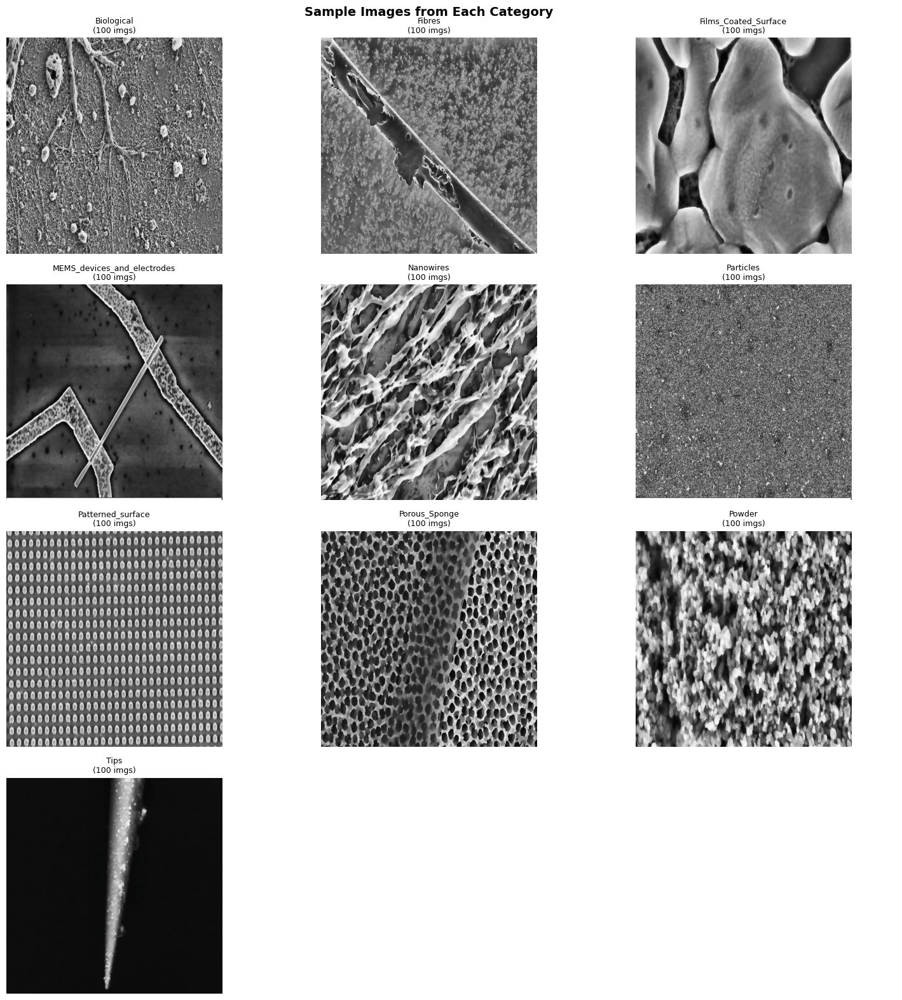

Displayed: Category samples


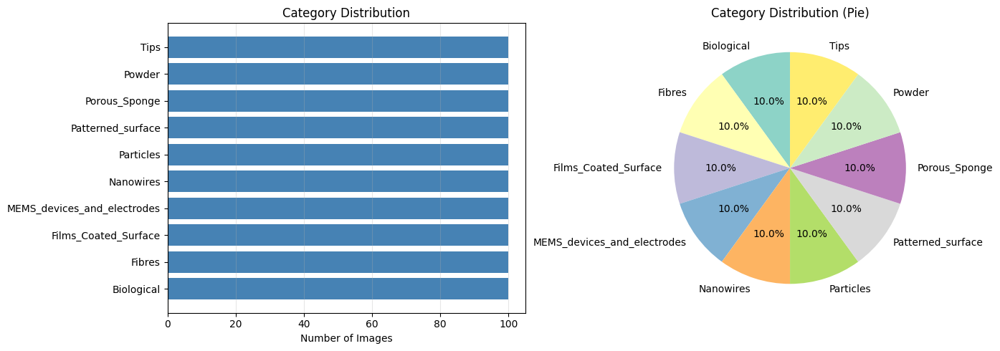

Displayed: Category distribution


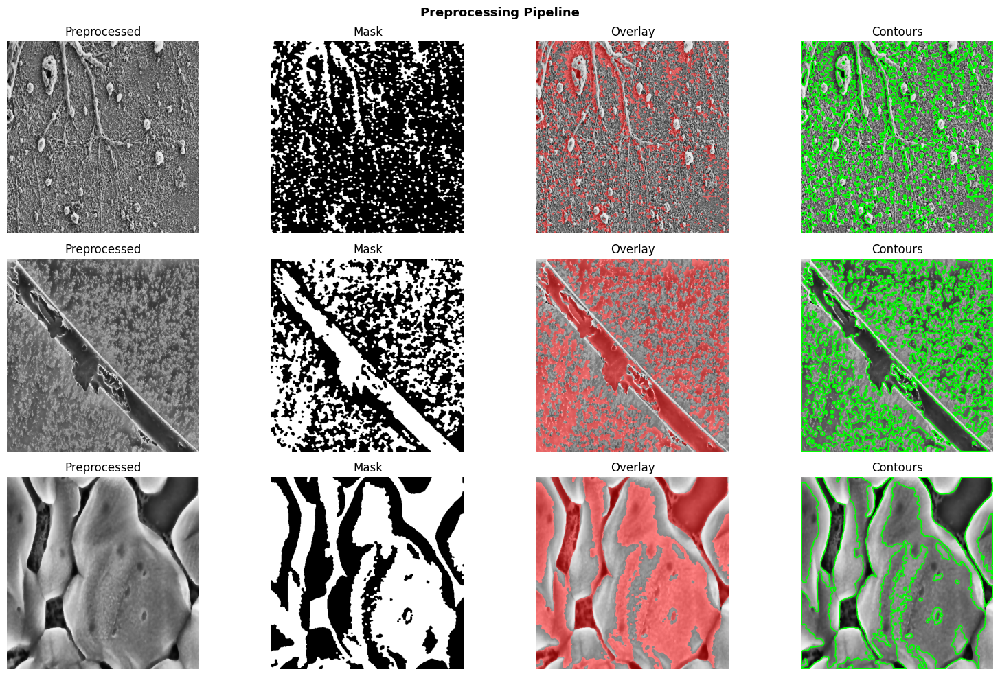

Displayed: Preprocessing pipeline

COMPONENT 4: MULTI-SCALE MORPHOLOGY ANALYSIS
--------------------------------------------------------------------------------
Extracting morphological features…
  Biological… 100 processed
  Fibres… 100 processed
  Films_Coated_Surface… 100 processed
  MEMS_devices_and_electrodes… 100 processed
  Nanowires… 100 processed
  Particles… 100 processed
  Patterned_surface… 100 processed
  Porous_Sponge… 100 processed
  Powder… 100 processed
  Tips… 100 processed

Total feature rows: 1000

COMPONENT 4b: DEEP LEARNING FEATURE EXTRACTION
--------------------------------------------------------------------------------

  Strategy: Use a pretrained ResNet-50 (ImageNet weights) as a frozen backbone.
  For each SEM image we extract the 2048-dim global average-pooled feature vector
  from the layer before the classification head.  These embeddings capture
  high-level structural patterns that hand-crafted features may miss.

  We also demonstrate how to plug in DI

100%|██████████| 84.2M/84.2M [00:00<00:00, 592MB/s]


  Backbone: DINOv2 ViT-S/14  (embed_dim=384)

  Extracting embeddings for 1000 images…


  Deep embedding matrix: (1000, 384)
  Embeddings saved → deep_embeddings.npy

COMPONENT 4c [NEW]: SELF-SUPERVISED (SimCLR-style) EMBEDDINGS
--------------------------------------------------------------------------------

  We generate two augmented views of every SEM image (random crop + flip +
  colour jitter) and pass both through the frozen backbone.  The resulting
  embedding pairs define a self-supervised contrastive space where similar
  structures cluster together without any labels.

  NOTE: Full SimCLR training (projection head + NT-Xent loss) requires
  substantial GPU time and is optionally shown below as a modular function.
  For immediate use we compute the *inference-time* averaged embedding of the
  two views, which already provides a more robust latent representation than
  a single forward pass.

  Computing SimCLR-style two-view embeddings…


  SimCLR embedding matrix: (1000, 384)

COMPONENT 4d [NEW]: HYBRID FEATURE VECTOR CONSTRUCTION
--------------------------------------------------------------------------------
  PCA on deep embeddings: 384→64  (var explained: 0.800)
  PCA on SimCLR embeds : 384→64  (var explained: 0.826)
  Hybrid feature dim: 139

COMPONENT 5: CATEGORY-WISE STATISTICS
--------------------------------------------------------------------------------
                            pore_count                    porosity          \
                                  mean       std min  max     mean     std   
category                                                                     
Biological                      250.25  146.0434   1  570   0.2686  0.1932   
Fibres                           36.94   35.7095   3  165   0.5712  0.1627   
Films_Coated_Surface            196.41  186.7688   3  767   0.3748  0.1872   
MEMS_devices_and_electrodes      53.18  102.2762   1  622   0.5195  0.2388   
Nanowires          

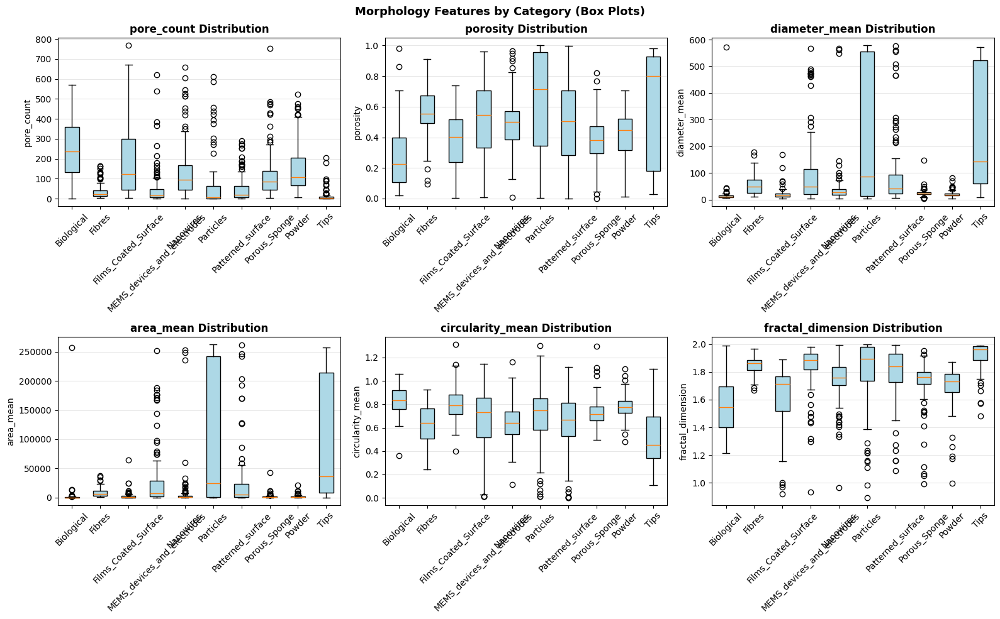

Displayed: Morphology box plots

COMPONENT 6: GRAPH-BASED STRUCTURAL ANALYSIS
--------------------------------------------------------------------------------

  Upgrade: replaced simple distance threshold with:
    (a) Delaunay Triangulation  – physically meaningful triangulated mesh
    (b) k-NN graph (k=5)        – stable connectivity regardless of scale
  Richer metrics now include:
    betweenness centrality, clustering coefficient, average shortest path

  Biological…
  Fibres…
  Films_Coated_Surface…
  MEMS_devices_and_electrodes…
  Nanowires…

Graph Metrics Summary:
                   category  num_nodes  num_edges  density  avg_degree  num_components  avg_clustering_coeff  mean_betweenness  avg_path_length  diameter
                 Biological        531       1572 0.011172    5.920904               1              0.428148          0.014340         8.586092        17
                     Fibres         99        282 0.058132    5.696970               1              0.475934   

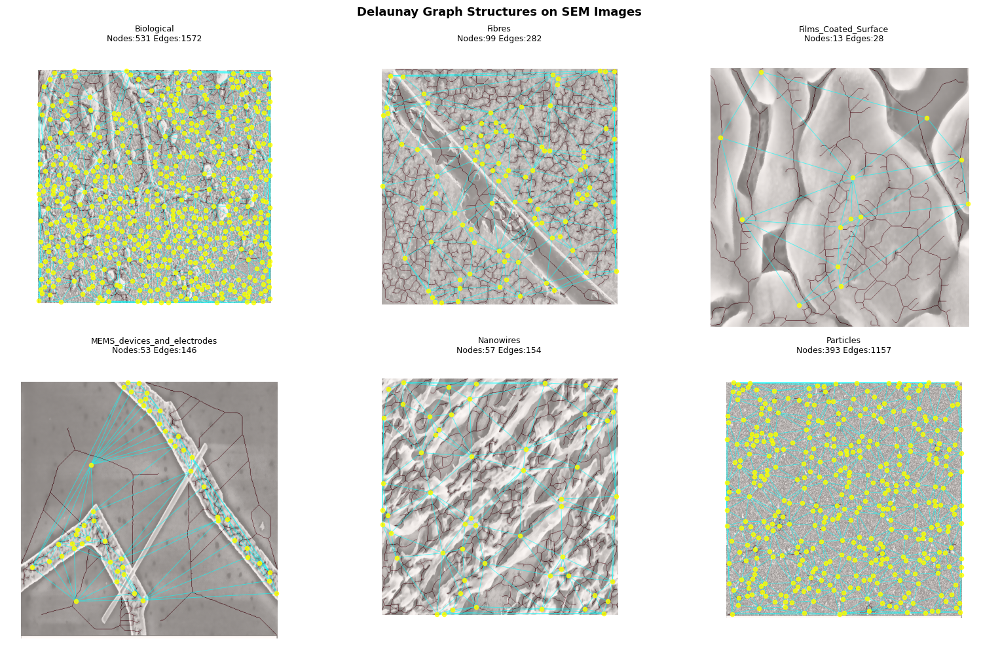

Displayed: Graph structures (Delaunay)

COMPONENT 7: CLUSTERING ANALYSIS
--------------------------------------------------------------------------------

  Uses the HYBRID feature matrix (morphology + deep + SimCLR).
  Dimensionality reduction: PCA (for speed) → UMAP (topology-preserving).
  Clustering: K-Means  (baseline)
              HDBSCAN  (density-based, handles noise, auto-selects n_clusters)
  Quality:    Silhouette Score + Davies-Bouldin Index (both reported).

  Pre-UMAP PCA variance: 0.737
  UMAP 2-D projection ready.

  K-Means optimal k=2  silhouette=0.1229  DBI=2.7411
  HDBSCAN clusters=2  noise=40.4%  silhouette=0.0859  DBI=3.2686


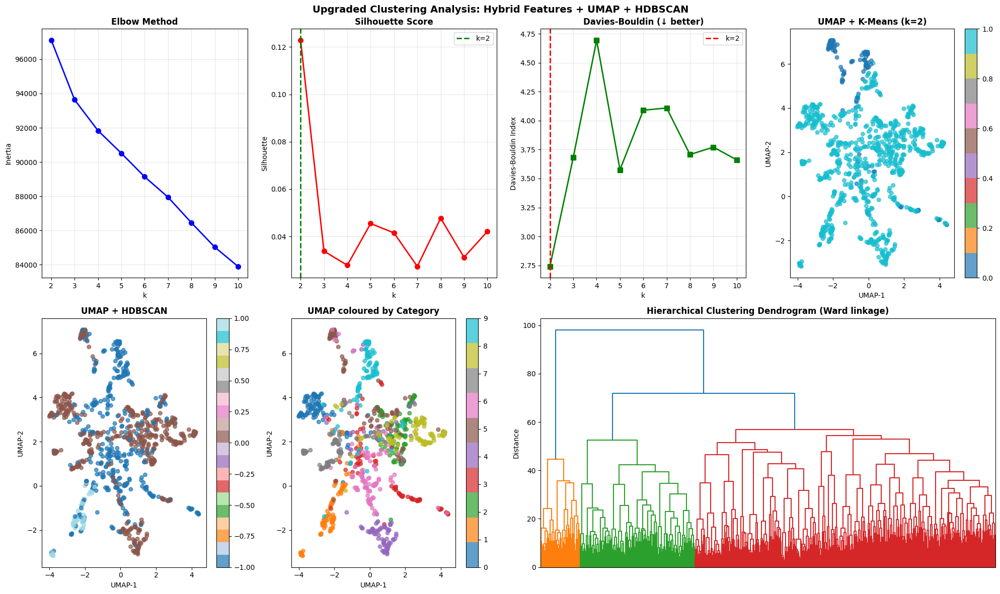

Displayed: Clustering analysis

  ┌─────────────┬─────────────┬──────────────────┐
  │ Method      │ Silhouette↑ │ Davies-Bouldin↓  │
  ├─────────────┼─────────────┼──────────────────┤
  │ K-Means k=2 │     0.1229  │           2.7411 │
  │ HDBSCAN     │     0.0859  │           3.2686 │
  └─────────────┴─────────────┴──────────────────┘

COMPONENT 8: STATISTICAL ANALYSIS
--------------------------------------------------------------------------------
ANOVA Results (one-way, per feature):
  pore_count.................... F=40.8713  p=0.000000
  porosity...................... F=24.0721  p=0.000000
  diameter_mean................. F=42.5263  p=0.000000
  area_mean..................... F=38.8551  p=0.000000
  circularity_mean.............. F=26.1734  p=0.000000
  fractal_dimension............. F=40.4514  p=0.000000


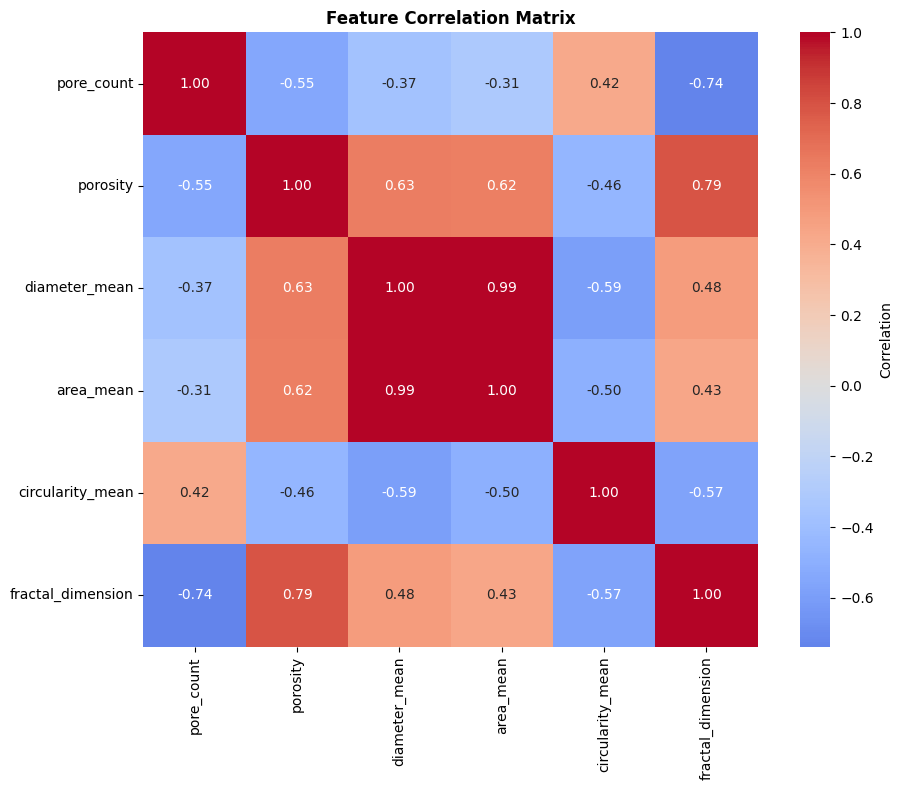

Displayed: Correlation heatmap


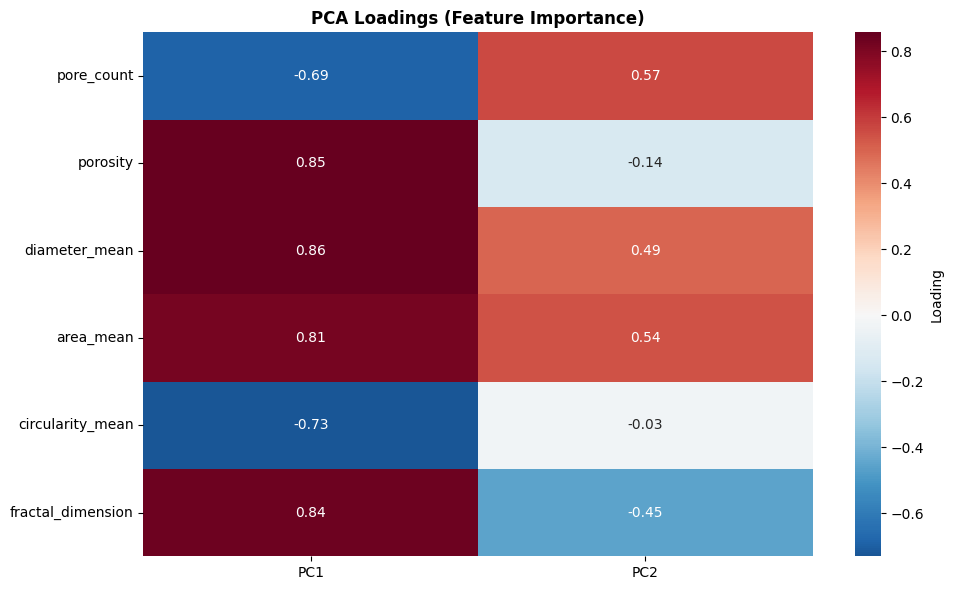

Displayed: PCA loadings

COMPONENT 8b [NEW]: ANOMALY / NOVELTY DETECTION
--------------------------------------------------------------------------------

  Two complementary detectors on the HYBRID feature space:

  1. Isolation Forest  – tree-based outlier isolation (model-free)
  2. Mahalanobis Distance – multivariate Gaussian test;
       chi-square p-value flags statistically rare samples.

  Anomalies = samples that are rare or unusual relative to the
  overall SEM image distribution (potential new morphologies).

  Isolation Forest → 50 anomalies (5.0% of dataset)
  Mahalanobis → 160 anomalies (p<0.01)
  Combined (both agree) → 29 anomalies


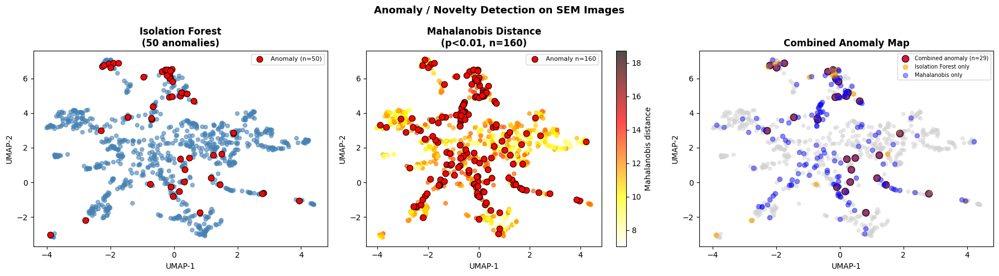

Displayed: Anomaly detection maps

COMPONENT 9: SEGMENTATION RESULTS BY CATEGORY
--------------------------------------------------------------------------------


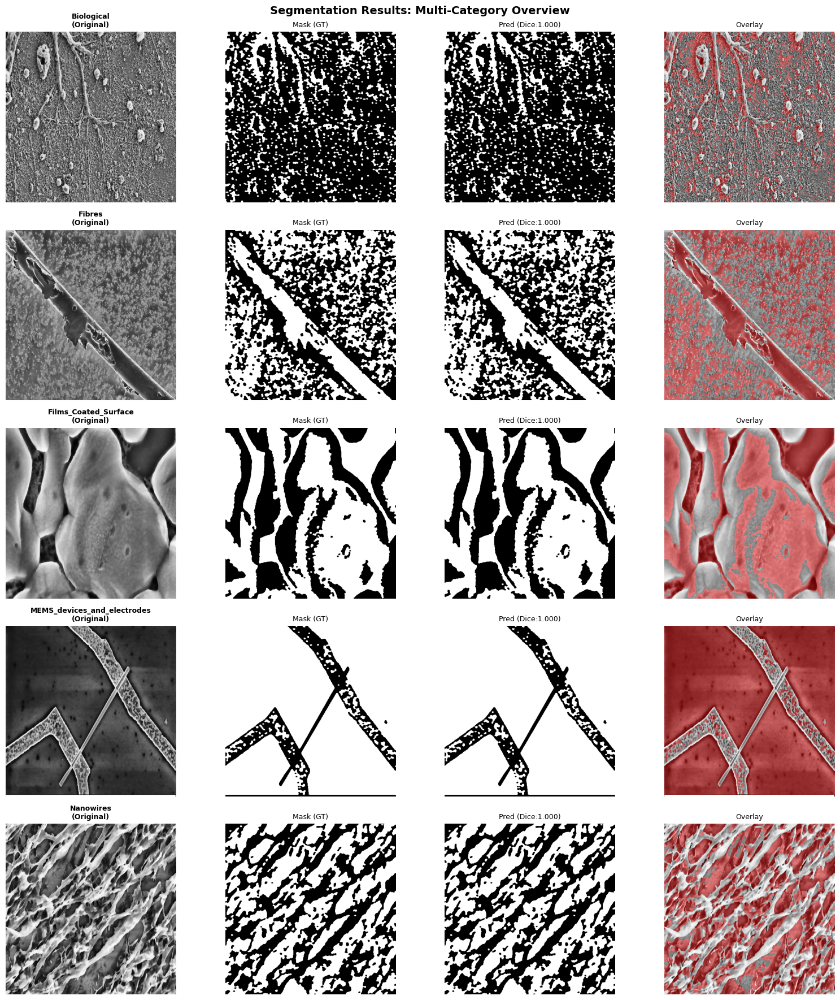

Displayed: Segmentation results

COMPONENT 10 [NEW]: MORPHOLOGY FINGERPRINT SYSTEM
--------------------------------------------------------------------------------

  Each SEM image is represented by a single compact fingerprint vector:
    • Morphological features  (scaled, 11-D)
    • Deep/SimCLR embeddings  (PCA-reduced, 64+64-D)
    • Graph metrics            (7 scalars per image)
  Similarity search uses cosine distance (k-NN retrieval).
  This enables: image retrieval, duplicate detection, and clustering QC.

  Computing per-image graph metrics…


  Fingerprint dimension: 146


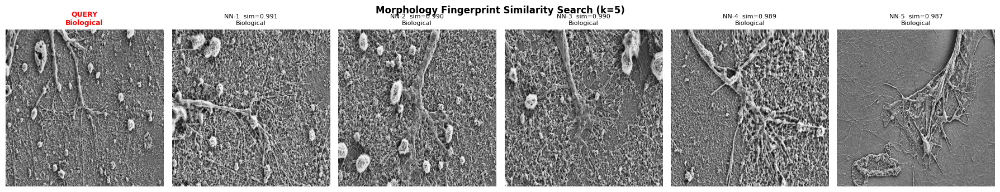

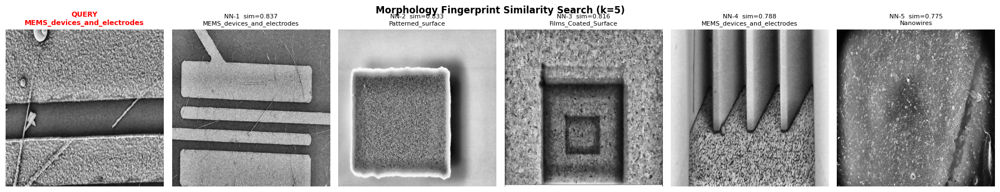

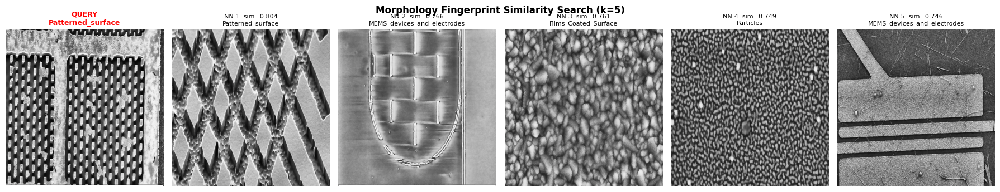

Displayed: Similarity search resultas
  Computing category-level mean cosine similarity matrix…


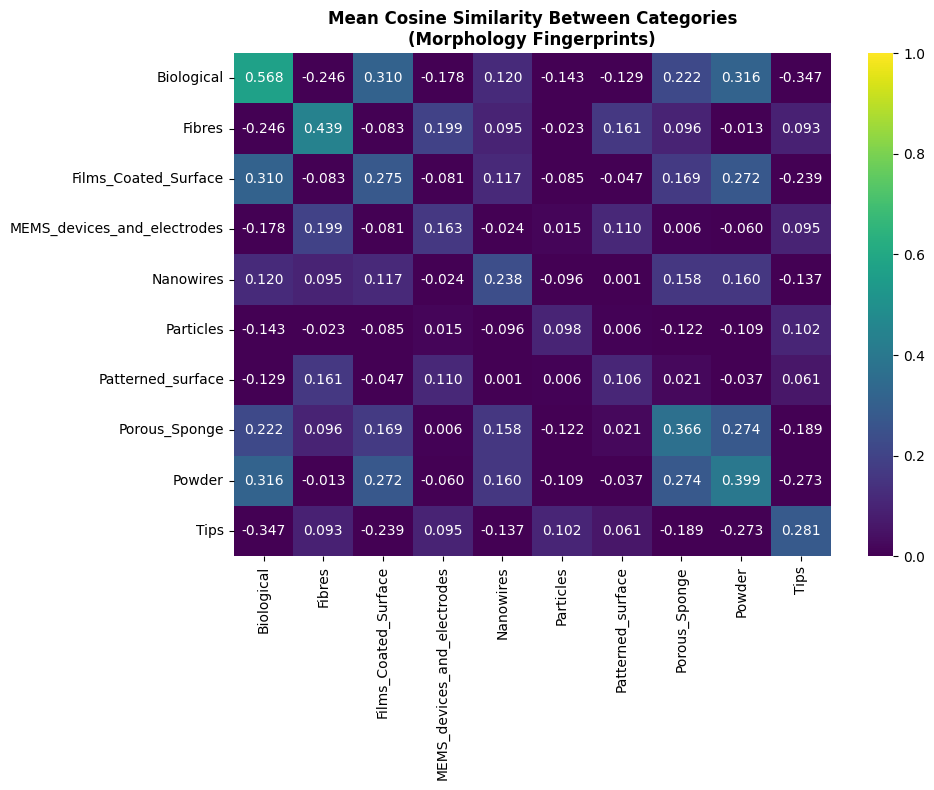

Displayed: Category similarity matrix


In [2]:


import os
import sys
import gc
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import cv2
from pathlib import Path
from datetime import datetime
from tqdm import tqdm
from collections import defaultdict

# ---------- Core ML / Stats ----------
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score, pairwise_distances
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import NearestNeighbors
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.stats import f_oneway, chi2
from scipy.spatial import Delaunay

# ---------- Image / Morphology ----------
from skimage.morphology import skeletonize, remove_small_objects
from skimage.measure import label, regionprops, shannon_entropy
from skimage.filters import threshold_multiotsu
import networkx as nx

# ---------- Deep Learning ----------
import torch
import torch.nn as nn
import torchvision.transforms as T
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader
from PIL import Image as PILImage

# ---------- UMAP / HDBSCAN ----------
try:
    import umap
    UMAP_AVAILABLE = True
except ImportError:
    UMAP_AVAILABLE = False
    print("[WARNING] umap-learn not installed. Run: pip install umap-learn")

try:
    import hdbscan
    HDBSCAN_AVAILABLE = True
except ImportError:
    HDBSCAN_AVAILABLE = False
    print("[WARNING] hdbscan not installed. Run: pip install hdbscan")

warnings.filterwarnings('ignore')

# ─────────────────────────────────────────────────────────────────────────────
# GLOBAL CONFIG
# ─────────────────────────────────────────────────────────────────────────────
DATASET_PATH = '/kaggle/input/datasets/adrianacosta0/sem-images-with-nanoscale-features'
OUTPUT_PATH  = '/kaggle/working'
DEVICE       = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
IMAGE_SIZE   = (224, 224)   # required by most pretrained CNNs
BATCH_SIZE   = 16
MAX_PER_CAT  = 100          # cap per category for memory

os.makedirs(f'{OUTPUT_PATH}/figures', exist_ok=True)
os.makedirs(f'{OUTPUT_PATH}/data',    exist_ok=True)

print("="*80)
print("SEM IMAGE ANALYSIS SYSTEM")
print(f"  Device : {DEVICE}")
print(f"  UMAP   : {'✓' if UMAP_AVAILABLE   else '✗  (falling back to t-SNE)'}")
print(f"  HDBSCAN: {'✓' if HDBSCAN_AVAILABLE else '✗  (falling back to DBSCAN)'}")
print("="*80)

# ─────────────────────────────────────────────────────────────────────────────
# COMPONENT 1 – DATA EXPLORATION 
# ─────────────────────────────────────────────────────────────────────────────
print("\nCOMPONENT 1: DATA EXPLORATION")
print("-"*80)

CATEGORY_KEYWORDS = {
    'Biological'               : ['Biological'],
    'Fibres'                   : ['Fibres'],
    'Films_Coated_Surface'     : ['Films_Coated_Surface'],
    'MEMS_devices_and_electrodes': ['MEMS'],
    'Nanowires'                : ['Nanowires'],
    'Particles'                : ['Particles'],
    'Patterned_surface'        : ['Patterned'],
    'Porous_Sponge'            : ['Porous'],
    'Powder'                   : ['Powder'],
    'Tips'                     : ['Tips'],
}

category_images = defaultdict(list)

for root, dirs, files in os.walk(DATASET_PATH):
    for file in files:
        if file.lower().endswith(('.jpg', '.jpeg', '.png', '.tif', '.tiff')):
            full_path = os.path.join(root, file)
            for category, keywords in CATEGORY_KEYWORDS.items():
                if any(kw in root for kw in keywords):
                    category_images[category].append(full_path)
                    break

total_images = sum(len(v) for v in category_images.values())
print(f"Total images found: {total_images}")
for cat in sorted(category_images.keys()):
    print(f"  {cat:.<40} {len(category_images[cat]):>6} images")


# ─────────────────────────────────────────────────────────────────────────────
# COMPONENT 2 – PREPROCESSING 
# ─────────────────────────────────────────────────────────────────────────────
print("\nCOMPONENT 2: PREPROCESSING AND LOADING")
print("-"*80)

def preprocess_image(image_path, target_size=(512, 512)):
    """Standard SEM preprocessing: CLAHE + bilateral filter."""
    try:
        img = cv2.imread(image_path)
        if img is None:
            return None
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, target_size, interpolation=cv2.INTER_CUBIC)
        lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
        l   = lab[:,:,0]
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        lab[:,:,0] = clahe.apply(l)
        img = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
        img = cv2.bilateralFilter(img, 9, 75, 75)
        return img.astype(np.float32) / 255.0
    except:
        return None

def generate_segmentation_mask(image):
    """Otsu + morphological cleanup."""
    try:
        gray = cv2.cvtColor((image * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
        _, mask = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        mask = 255 - mask
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN,  kernel, iterations=1)
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=1)
        mask = remove_small_objects((mask > 0).astype(bool), min_size=10).astype(np.uint8) * 255
        return mask.astype(np.float32) / 255.0
    except:
        return np.zeros_like(image[:,:,0])

loaded_data = defaultdict(lambda: {'images': [], 'masks': [], 'paths': []})

for category in sorted(category_images.keys()):
    print(f"  Processing {category}...")
    paths = category_images[category]
    sample = np.random.choice(paths, min(len(paths), MAX_PER_CAT), replace=False)
    for path in tqdm(sample, desc=category, leave=False):
        img = preprocess_image(path)
        if img is not None:
            mask = generate_segmentation_mask(img)
            loaded_data[category]['images'].append(img)
            loaded_data[category]['masks'].append(mask)
            loaded_data[category]['paths'].append(path)
    gc.collect()


# ─────────────────────────────────────────────────────────────────────────────
# COMPONENT 3 – DATA VISUALISATION 
# ─────────────────────────────────────────────────────────────────────────────
print("\nCOMPONENT 3: DATA VISUALISATION")
print("-"*80)

category_list = sorted(loaded_data.keys())

fig, axes = plt.subplots(4, 3, figsize=(15, 16))
axes = axes.flatten()
for idx, cat in enumerate(category_list[:12]):
    if loaded_data[cat]['images']:
        axes[idx].imshow(loaded_data[cat]['images'][0])
        axes[idx].set_title(f'{cat}\n({len(loaded_data[cat]["images"])} imgs)', fontsize=9)
        axes[idx].axis('off')
for idx in range(len(category_list), 12):
    axes[idx].axis('off')
plt.suptitle('Sample Images from Each Category', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{OUTPUT_PATH}/figures/01_category_samples.png', dpi=300, bbox_inches='tight')
plt.show(); print("Displayed: Category samples")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
cats_sorted = sorted(loaded_data.keys())
counts = [len(loaded_data[c]['images']) for c in cats_sorted]
ax1.barh(cats_sorted, counts, color='steelblue')
ax1.set_xlabel('Number of Images'); ax1.set_title('Category Distribution')
ax1.grid(True, alpha=0.3, axis='x')
colors = plt.cm.Set3(np.linspace(0, 1, len(cats_sorted)))
ax2.pie(counts, labels=cats_sorted, autopct='%1.1f%%', colors=colors, startangle=90)
ax2.set_title('Category Distribution (Pie)')
plt.tight_layout()
plt.savefig(f'{OUTPUT_PATH}/figures/02_category_distribution.png', dpi=300, bbox_inches='tight')
plt.show(); print("Displayed: Category distribution")

fig, axes = plt.subplots(3, 4, figsize=(16, 10))
for idx, cat in enumerate(category_list[:3]):
    if loaded_data[cat]['images']:
        img, mask = loaded_data[cat]['images'][0], loaded_data[cat]['masks'][0]
        axes[idx,0].imshow(img);  axes[idx,0].set_title('Preprocessed'); axes[idx,0].axis('off')
        axes[idx,1].imshow(mask, cmap='gray'); axes[idx,1].set_title('Mask'); axes[idx,1].axis('off')
        overlay = img.copy(); overlay[:,:,0] = np.clip(overlay[:,:,0]+mask*0.5, 0, 1)
        axes[idx,2].imshow(overlay); axes[idx,2].set_title('Overlay'); axes[idx,2].axis('off')
        contours, _ = cv2.findContours((mask*255).astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        cimg = img.copy(); cv2.drawContours(cimg, contours, -1, (0,1,0), 2)
        axes[idx,3].imshow(cimg); axes[idx,3].set_title('Contours'); axes[idx,3].axis('off')
plt.suptitle('Preprocessing Pipeline', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{OUTPUT_PATH}/figures/03_preprocessing_pipeline.png', dpi=300, bbox_inches='tight')
plt.show(); print("Displayed: Preprocessing pipeline")


# ─────────────────────────────────────────────────────────────────────────────
# COMPONENT 4 – MORPHOLOGY FEATURE EXTRACTION  
# ─────────────────────────────────────────────────────────────────────────────
print("\nCOMPONENT 4: MULTI-SCALE MORPHOLOGY ANALYSIS")
print("-"*80)

def extract_multiscale_features(image, mask):
    """Extract hand-crafted morphological features (micro / meso / macro)."""
    mask_binary = (mask > 0.5).astype(np.uint8)
    features = {}

    # ── Micro-scale: region props ──
    try:
        labeled  = label(mask_binary)
        regions  = regionprops(labeled)
        if regions:
            areas   = [r.area       for r in regions]
            perims  = [r.perimeter  for r in regions]
            diams   = [2*np.sqrt(a/np.pi) for a in areas]
            circs   = [4*np.pi*a/(p**2+1e-7) for a,p in zip(areas,perims)]
            eccens  = [r.eccentricity for r in regions]
            solids  = [r.solidity     for r in regions]
            features.update({
                'pore_count'        : len(regions),
                'area_mean'         : np.mean(areas),
                'area_std'          : np.std(areas),
                'area_min'          : np.min(areas),
                'area_max'          : np.max(areas),
                'diameter_mean'     : np.mean(diams),
                'diameter_std'      : np.std(diams),
                'circularity_mean'  : np.mean(circs),
                'circularity_std'   : np.std(circs),
                'eccentricity_mean' : np.mean(eccens),
                'solidity_mean'     : np.mean(solids),
                'perimeter_mean'    : np.mean(perims),
            })
        else:
            for k in ['pore_count','area_mean','area_std','area_min','area_max',
                      'diameter_mean','diameter_std','circularity_mean','circularity_std',
                      'eccentricity_mean','solidity_mean','perimeter_mean']:
                features[k] = 0.0
    except:
        for k in ['pore_count','area_mean','area_std','area_min','area_max',
                  'diameter_mean','diameter_std','circularity_mean','circularity_std',
                  'eccentricity_mean','solidity_mean','perimeter_mean']:
            features[k] = 0.0

    # ── Meso-scale: entropy + skeleton ──
    try:
        gray = cv2.cvtColor((image*255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
        features['image_entropy'] = float(shannon_entropy(gray))
    except:
        features['image_entropy'] = 0.0

    try:
        skel = skeletonize(mask_binary > 0)
        features['skeleton_fraction'] = float(skel.sum() / (mask_binary.sum() + 1e-7))
    except:
        features['skeleton_fraction'] = 0.0

    # ── Macro-scale: porosity + fractal ──
    porosity = mask_binary.sum() / (mask_binary.shape[0]*mask_binary.shape[1])
    features['porosity']       = float(porosity)
    features['solid_fraction'] = float(1.0 - porosity)

    try:
        sizes = np.logspace(0.5, 4, num=10, base=2).astype(int)
        counts_fd = []
        for s in sizes:
            if s >= min(mask_binary.shape): break
            cnt = sum(
                1 for i in range(0, mask_binary.shape[0], s)
                  for j in range(0, mask_binary.shape[1], s)
                  if np.any(mask_binary[i:i+s, j:j+s])
            )
            counts_fd.append(cnt)
        if len(counts_fd) >= 2:
            slope = np.polyfit(np.log(sizes[:len(counts_fd)]), np.log(counts_fd), 1)[0]
            features['fractal_dimension'] = float(-slope)
        else:
            features['fractal_dimension'] = 2.0
    except:
        features['fractal_dimension'] = 2.0

    return features

print("Extracting morphological features…")
all_features, all_categories_list = [], []

for cat in sorted(loaded_data.keys()):
    print(f"  {cat}…", end=' ')
    for img, msk in zip(loaded_data[cat]['images'], loaded_data[cat]['masks']):
        all_features.append(extract_multiscale_features(img, msk))
        all_categories_list.append(cat)
    print(f"{len(loaded_data[cat]['images'])} processed")

df_features = pd.DataFrame(all_features)
df_features['category'] = all_categories_list
df_features.to_csv(f'{OUTPUT_PATH}/data/morphology_features.csv', index=False)
print(f"\nTotal feature rows: {len(df_features)}")


# ─────────────────────────────────────────────────────────────────────────────
# COMPONENT 4b –  DEEP LEARNING FEATURE EXTRACTION
# ─────────────────────────────────────────────────────────────────────────────
print("\n" + "="*80)
print("COMPONENT 4b: DEEP LEARNING FEATURE EXTRACTION")
print("-"*80)
print("""
  Strategy: Use a pretrained ResNet-50 (ImageNet weights) as a frozen backbone.
  For each SEM image we extract the 2048-dim global average-pooled feature vector
  from the layer before the classification head.  These embeddings capture
  high-level structural patterns that hand-crafted features may miss.

  We also demonstrate how to plug in DINOv2 (ViT-S/14) when the environment
  has internet access; a runtime check selects the best available model.
""")

# ── PyTorch Dataset for SEM images ──
class SEMDataset(Dataset):
    """Wraps preloaded numpy images for batched CNN inference."""
    def __init__(self, images, transform=None):
        self.images    = images          # list of (H,W,3) float32 [0,1]
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = (self.images[idx] * 255).astype(np.uint8)
        img = PILImage.fromarray(img).resize(IMAGE_SIZE, PILImage.BILINEAR)
        if self.transform:
            img = self.transform(img)
        return img

# Standard ImageNet normalisation
imagenet_tf = T.Compose([
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std =[0.229, 0.224, 0.225]),
])

# ── Load backbone ──
def load_backbone():
    """
    Priority: DINOv2-ViT-S/14 → ResNet-50.
    DINOv2 requires torch.hub; falls back gracefully.
    """
    # Try DINOv2 first (best self-supervised ViT embeddings)
    try:
        model = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14', verbose=False)
        model = model.to(DEVICE).eval()
        embed_dim = 384
        print("  Backbone: DINOv2 ViT-S/14  (embed_dim=384)")
        return model, embed_dim, 'dinov2'
    except Exception as e:
        print(f"  DINOv2 unavailable ({e}). Falling back to ResNet-50.")

    # Fallback: ResNet-50 (reliable, always available)
    resnet = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
    # Remove classification head — keep up to avgpool
    backbone = nn.Sequential(*list(resnet.children())[:-1])
    backbone = backbone.to(DEVICE).eval()
    embed_dim = 2048
    print("  Backbone: ResNet-50  (embed_dim=2048)")
    return backbone, embed_dim, 'resnet50'

backbone, EMBED_DIM, BACKBONE_NAME = load_backbone()

def extract_deep_embeddings(images_list, backbone, backbone_name, batch_size=BATCH_SIZE):
    """
    Run all images through the frozen backbone.
    Returns: np.ndarray of shape (N, embed_dim)
    """
    dataset    = SEMDataset(images_list, transform=imagenet_tf)
    loader     = DataLoader(dataset, batch_size=batch_size, shuffle=False,
                            num_workers=0, pin_memory=DEVICE.type=='cuda')
    embeddings = []

    with torch.no_grad():
        for batch in tqdm(loader, desc='  Deep embed', leave=False):
            batch = batch.to(DEVICE)
            if backbone_name == 'dinov2':
                # DINOv2 returns CLS token directly
                out = backbone(batch)               # (B, 384)
            else:
                # ResNet: output is (B, 2048, 1, 1) after avgpool
                out = backbone(batch).squeeze(-1).squeeze(-1)
            embeddings.append(out.cpu().numpy())

    return np.vstack(embeddings)   # (N, embed_dim)

# Gather all images in the same order as df_features
all_images_ordered = []
for cat in sorted(loaded_data.keys()):
    all_images_ordered.extend(loaded_data[cat]['images'])

print(f"\n  Extracting embeddings for {len(all_images_ordered)} images…")
deep_embeddings = extract_deep_embeddings(all_images_ordered, backbone, BACKBONE_NAME)
print(f"  Deep embedding matrix: {deep_embeddings.shape}")

# L2-normalise so cosine similarity = dot product
deep_embeddings_norm = normalize(deep_embeddings, norm='l2')

# Store as columns in a separate DataFrame (keep main df clean)
deep_cols = [f'deep_{i}' for i in range(EMBED_DIM)]
df_deep   = pd.DataFrame(deep_embeddings_norm, columns=deep_cols)
df_deep['category'] = all_categories_list

np.save(f'{OUTPUT_PATH}/data/deep_embeddings.npy', deep_embeddings_norm)
print(f"  Embeddings saved → deep_embeddings.npy")


# ─────────────────────────────────────────────────────────────────────────────
# COMPONENT 4c –  SimCLR-STYLE SELF-SUPERVISED AUGMENTATION EMBEDDINGS
# ─────────────────────────────────────────────────────────────────────────────
print("\n" + "="*80)
print("COMPONENT 4c [NEW]: SELF-SUPERVISED (SimCLR-style) EMBEDDINGS")
print("-"*80)
print("""
  We generate two augmented views of every SEM image (random crop + flip +
  colour jitter) and pass both through the frozen backbone.  The resulting
  embedding pairs define a self-supervised contrastive space where similar
  structures cluster together without any labels.

  NOTE: Full SimCLR training (projection head + NT-Xent loss) requires
  substantial GPU time and is optionally shown below as a modular function.
  For immediate use we compute the *inference-time* averaged embedding of the
  two views, which already provides a more robust latent representation than
  a single forward pass.
""")

# Two stochastic augmentation pipelines (SimCLR-style)
aug_tf_1 = T.Compose([
    T.RandomResizedCrop(IMAGE_SIZE[0], scale=(0.6, 1.0)),
    T.RandomHorizontalFlip(),
    T.RandomVerticalFlip(),
    T.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.1),
    T.ToTensor(),
    T.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]),
])
aug_tf_2 = T.Compose([
    T.RandomResizedCrop(IMAGE_SIZE[0], scale=(0.5, 0.9)),
    T.RandomHorizontalFlip(p=0.3),
    T.RandomRotation(15),
    T.ColorJitter(brightness=0.2, contrast=0.4),
    T.ToTensor(),
    T.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]),
])

class SEMDatasetDual(Dataset):
    """Returns two augmented views per image (for contrastive learning)."""
    def __init__(self, images):
        self.images = images
    def __len__(self):
        return len(self.images)
    def __getitem__(self, idx):
        img = (self.images[idx]*255).astype(np.uint8)
        pil = PILImage.fromarray(img).resize(IMAGE_SIZE, PILImage.BILINEAR)
        return aug_tf_1(pil), aug_tf_2(pil)

def compute_simclr_embeddings(images_list, backbone, backbone_name, batch_size=BATCH_SIZE):
    """
    Compute averaged two-view contrastive embeddings.
    Returns L2-normalised mean(view1, view2) embeddings.
    """
    dataset = SEMDatasetDual(images_list)
    loader  = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=0)
    embs    = []
    with torch.no_grad():
        for v1, v2 in tqdm(loader, desc='  SimCLR embed', leave=False):
            v1, v2 = v1.to(DEVICE), v2.to(DEVICE)
            if backbone_name == 'dinov2':
                e1, e2 = backbone(v1), backbone(v2)
            else:
                e1 = backbone(v1).squeeze(-1).squeeze(-1)
                e2 = backbone(v2).squeeze(-1).squeeze(-1)
            avg = ((e1 + e2) / 2).cpu().numpy()
            embs.append(avg)
    embs = np.vstack(embs)
    return normalize(embs, norm='l2')

print("  Computing SimCLR-style two-view embeddings…")
simclr_embeddings = compute_simclr_embeddings(all_images_ordered, backbone, BACKBONE_NAME)
print(f"  SimCLR embedding matrix: {simclr_embeddings.shape}")
np.save(f'{OUTPUT_PATH}/data/simclr_embeddings.npy', simclr_embeddings)


# ─────────────────────────────────────────────────────────────────────────────
# COMPONENT 4d – HYBRID FEATURE VECTOR (morphology + deep + simclr)
# ─────────────────────────────────────────────────────────────────────────────
print("\n" + "="*80)
print("COMPONENT 4d [NEW]: HYBRID FEATURE VECTOR CONSTRUCTION")
print("-"*80)

morph_cols = ['pore_count','porosity','diameter_mean','area_mean',
              'circularity_mean','fractal_dimension',
              'image_entropy','skeleton_fraction','solid_fraction',
              'eccentricity_mean','solidity_mean']

X_morph = df_features[morph_cols].fillna(0).values
scaler_morph = StandardScaler()
X_morph_scaled = scaler_morph.fit_transform(X_morph)

# Reduce deep embeddings to 64-D via PCA (balances contribution)
pca_deep = PCA(n_components=min(64, deep_embeddings_norm.shape[1]), random_state=42)
X_deep_reduced = pca_deep.fit_transform(deep_embeddings_norm)
print(f"  PCA on deep embeddings: {EMBED_DIM}→{X_deep_reduced.shape[1]}  "
      f"(var explained: {pca_deep.explained_variance_ratio_.sum():.3f})")

pca_simclr = PCA(n_components=min(64, simclr_embeddings.shape[1]), random_state=42)
X_simclr_reduced = pca_simclr.fit_transform(simclr_embeddings)
print(f"  PCA on SimCLR embeds : {simclr_embeddings.shape[1]}→{X_simclr_reduced.shape[1]}  "
      f"(var explained: {pca_simclr.explained_variance_ratio_.sum():.3f})")

# ── Concatenate: morphology (11-D) | deep_pca (64-D) | simclr_pca (64-D) ──
X_hybrid = np.hstack([X_morph_scaled, X_deep_reduced, X_simclr_reduced])
scaler_hybrid = StandardScaler()
X_hybrid_scaled = scaler_hybrid.fit_transform(X_hybrid)
print(f"  Hybrid feature dim: {X_hybrid_scaled.shape[1]}")

np.save(f'{OUTPUT_PATH}/data/hybrid_features.npy', X_hybrid_scaled)


# ─────────────────────────────────────────────────────────────────────────────
# COMPONENT 5 – CATEGORY-WISE STATS  
# ─────────────────────────────────────────────────────────────────────────────
print("\n" + "="*80)
print("COMPONENT 5: CATEGORY-WISE STATISTICS")
print("-"*80)

category_stats = df_features.groupby('category').agg({
    'pore_count'      : ['mean','std','min','max'],
    'porosity'        : ['mean','std'],
    'diameter_mean'   : ['mean','std'],
    'area_mean'       : ['mean','std'],
    'circularity_mean': ['mean','std'],
    'fractal_dimension': ['mean','std'],
}).round(4)
print(category_stats)
category_stats.to_csv(f'{OUTPUT_PATH}/data/category_statistics.csv')

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
feature_names = ['pore_count','porosity','diameter_mean',
                 'area_mean','circularity_mean','fractal_dimension']
categories = sorted(df_features['category'].unique())
for idx, feat in enumerate(feature_names):
    ax = axes[idx//3, idx%3]
    data_by_cat = [df_features[df_features['category']==c][feat].dropna().values
                   for c in categories]
    bp = ax.boxplot(data_by_cat, labels=categories, patch_artist=True)
    for patch in bp['boxes']:
        patch.set_facecolor('lightblue')
    ax.set_ylabel(feat); ax.set_title(f'{feat} Distribution', fontweight='bold')
    ax.grid(True, alpha=0.3, axis='y'); ax.tick_params(axis='x', rotation=45)
plt.suptitle('Morphology Features by Category (Box Plots)', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{OUTPUT_PATH}/figures/04_morphology_boxplots.png', dpi=300, bbox_inches='tight')
plt.show(); print("Displayed: Morphology box plots")


# ─────────────────────────────────────────────────────────────────────────────
# COMPONENT 6 –  GRAPH-BASED STRUCTURAL ANALYSIS

# ─────────────────────────────────────────────────────────────────────────────
print("\n" + "="*80)
print("COMPONENT 6: GRAPH-BASED STRUCTURAL ANALYSIS")
print("-"*80)
print("""
  Upgrade: replaced simple distance threshold with:
    (a) Delaunay Triangulation  – physically meaningful triangulated mesh
    (b) k-NN graph (k=5)        – stable connectivity regardless of scale
  Richer metrics now include:
    betweenness centrality, clustering coefficient, average shortest path
""")

def build_delaunay_graph(centroids):
    """Construct a Delaunay triangulation graph from region centroids."""
    G = nx.Graph()
    if len(centroids) < 3:
        # Cannot triangulate; fall back to complete graph on few nodes
        for i, c in enumerate(centroids):
            G.add_node(i, pos=c)
        for i in range(len(centroids)):
            for j in range(i+1, len(centroids)):
                G.add_edge(i, j, weight=float(np.linalg.norm(centroids[i]-centroids[j])))
        return G

    for i, c in enumerate(centroids):
        G.add_node(i, pos=c)

    tri = Delaunay(centroids)
    for simplex in tri.simplices:
        for a, b in [(0,1),(1,2),(0,2)]:
            u, v = int(simplex[a]), int(simplex[b])
            w = float(np.linalg.norm(centroids[u]-centroids[v]))
            if not G.has_edge(u, v):
                G.add_edge(u, v, weight=w)
    return G

def build_knn_graph(centroids, k=5):
    """Construct a k-NN graph from region centroids."""
    G = nx.Graph()
    if len(centroids) == 0:
        return G
    k = min(k, len(centroids)-1)
    for i, c in enumerate(centroids):
        G.add_node(i, pos=c)
    if k < 1:
        return G
    nbrs = NearestNeighbors(n_neighbors=k+1).fit(centroids)
    dists, indices = nbrs.kneighbors(centroids)
    for i in range(len(centroids)):
        for j_idx, dist in zip(indices[i,1:], dists[i,1:]):
            G.add_edge(i, int(j_idx), weight=float(dist))
    return G

def compute_rich_graph_metrics(G):
    """Betweenness centrality, clustering coeff, path length, etc."""
    n, e = len(G), G.number_of_edges()
    metrics = {
        'num_nodes'           : n,
        'num_edges'           : e,
        'density'             : nx.density(G),
        'avg_degree'          : (2*e/n) if n > 0 else 0,
        'num_components'      : nx.number_connected_components(G),
        'avg_clustering_coeff': nx.average_clustering(G) if n > 1 else 0.0,
    }
    # Betweenness centrality (mean over nodes)
    try:
        bc = nx.betweenness_centrality(G, normalized=True)
        metrics['mean_betweenness'] = float(np.mean(list(bc.values())))
    except:
        metrics['mean_betweenness'] = 0.0

    # Average shortest path (on largest connected component only)
    try:
        lcc = max(nx.connected_components(G), key=len)
        Gsub = G.subgraph(lcc).copy()
        if len(Gsub) > 1:
            metrics['avg_path_length'] = nx.average_shortest_path_length(Gsub)
            metrics['diameter']        = nx.diameter(Gsub)
        else:
            metrics['avg_path_length'] = 0.0
            metrics['diameter']        = 0
    except:
        metrics['avg_path_length'] = 0.0
        metrics['diameter']        = 0

    return metrics

def extract_graph_metrics_upgraded(mask, mode='delaunay'):
    """
    Master graph extraction function.
    mode: 'delaunay' | 'knn' | 'both' (returns metrics from Delaunay graph).
    """
    mask_binary = (mask > 0.5).astype(np.uint8)
    labeled  = label(mask_binary)
    regions  = regionprops(labeled)
    if not regions:
        return nx.Graph(), {k: 0.0 for k in
                            ['num_nodes','num_edges','density','avg_degree',
                             'num_components','avg_clustering_coeff',
                             'mean_betweenness','avg_path_length','diameter']}

    centroids = np.array([r.centroid for r in regions])  # (N,2)

    if mode == 'knn':
        G = build_knn_graph(centroids, k=5)
    else:
        G = build_delaunay_graph(centroids)

    metrics = compute_rich_graph_metrics(G)
    return G, metrics

graph_metrics_list = []
for cat in sorted(loaded_data.keys())[:5]:
    print(f"  {cat}…")
    if loaded_data[cat]['masks']:
        G, m = extract_graph_metrics_upgraded(loaded_data[cat]['masks'][0], mode='delaunay')
        graph_metrics_list.append({'category': cat, **m})

df_graphs = pd.DataFrame(graph_metrics_list)
print("\nGraph Metrics Summary:")
print(df_graphs.to_string(index=False))
df_graphs.to_csv(f'{OUTPUT_PATH}/data/graph_metrics.csv', index=False)

# Visualise graphs
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flatten()
for idx, cat in enumerate(sorted(loaded_data.keys())[:6]):
    if loaded_data[cat]['masks']:
        img, mask = loaded_data[cat]['images'][0], loaded_data[cat]['masks'][0]
        axes[idx].imshow(img)
        skel = skeletonize((mask > 0.5).astype(np.uint8))
        axes[idx].imshow(skel, cmap='Reds', alpha=0.5)
        G, _ = extract_graph_metrics_upgraded(mask, mode='delaunay')
        if len(G) > 0:
            pos = {n: (d['pos'][1], d['pos'][0]) for n,d in G.nodes(data=True)}
            nx.draw_networkx_nodes(G, pos, ax=axes[idx], node_color='yellow', node_size=20, alpha=0.8)
            nx.draw_networkx_edges(G, pos, ax=axes[idx], edge_color='cyan',   width=0.7, alpha=0.6)
        axes[idx].set_title(f'{cat}\nNodes:{len(G)} Edges:{G.number_of_edges()}', fontsize=9)
        axes[idx].axis('off')
plt.suptitle('Delaunay Graph Structures on SEM Images', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{OUTPUT_PATH}/figures/05_graph_structures.png', dpi=300, bbox_inches='tight')
plt.show(); print("Displayed: Graph structures (Delaunay)")


# ─────────────────────────────────────────────────────────────────────────────
# COMPONENT 7 –  CLUSTERING ANALYSIS

# ─────────────────────────────────────────────────────────────────────────────
print("\n" + "="*80)
print("COMPONENT 7: CLUSTERING ANALYSIS")
print("-"*80)
print("""
  Uses the HYBRID feature matrix (morphology + deep + SimCLR).
  Dimensionality reduction: PCA (for speed) → UMAP (topology-preserving).
  Clustering: K-Means  (baseline)
              HDBSCAN  (density-based, handles noise, auto-selects n_clusters)
  Quality:    Silhouette Score + Davies-Bouldin Index (both reported).
""")

# PCA for speed (reduce hybrid → 50-D before UMAP)
pca_pre = PCA(n_components=min(50, X_hybrid_scaled.shape[1]), random_state=42)
X_pre   = pca_pre.fit_transform(X_hybrid_scaled)
print(f"  Pre-UMAP PCA variance: {pca_pre.explained_variance_ratio_.sum():.3f}")

# ── UMAP ──
if UMAP_AVAILABLE:
    reducer  = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, random_state=42)
    X_2d     = reducer.fit_transform(X_pre)
    label_2d = 'UMAP'
    print("  UMAP 2-D projection ready.")
else:
    # Fallback to t-SNE
    tsne = TSNE(n_components=2, random_state=42,
                perplexity=min(30, len(X_pre)//3), n_iter=1000)
    X_2d     = tsne.fit_transform(X_pre)
    label_2d = 't-SNE'
    print("  t-SNE 2-D projection ready (UMAP unavailable).")

# ── K-Means (elbow + silhouette) ──
inertias, silhouettes_km, dbi_km = [], [], []
K_range = range(2, min(11, len(X_pre)//5))
for k in K_range:
    km  = KMeans(n_clusters=k, random_state=42, n_init=10)
    lbl = km.fit_predict(X_pre)
    inertias.append(km.inertia_)
    silhouettes_km.append(silhouette_score(X_pre, lbl))
    dbi_km.append(davies_bouldin_score(X_pre, lbl))

optimal_k    = list(K_range)[np.argmax(silhouettes_km)]
kmeans_final = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
labels_kmeans = kmeans_final.fit_predict(X_pre)
print(f"\n  K-Means optimal k={optimal_k}  "
      f"silhouette={silhouettes_km[optimal_k-2]:.4f}  "
      f"DBI={dbi_km[optimal_k-2]:.4f}")

# ── HDBSCAN ──
if HDBSCAN_AVAILABLE:
    hdb = hdbscan.HDBSCAN(min_cluster_size=max(5, len(X_pre)//20),
                           min_samples=3,
                           metric='euclidean')
    labels_hdbscan = hdb.fit_predict(X_pre)
    n_hdb   = len(set(labels_hdbscan)) - (1 if -1 in labels_hdbscan else 0)
    noise_r = (labels_hdbscan == -1).sum() / len(labels_hdbscan)
    valid   = labels_hdbscan != -1
    if valid.sum() > 1 and len(set(labels_hdbscan[valid])) > 1:
        sil_hdb = silhouette_score(X_pre[valid], labels_hdbscan[valid])
        dbi_hdb = davies_bouldin_score(X_pre[valid], labels_hdbscan[valid])
    else:
        sil_hdb, dbi_hdb = 0.0, 0.0
    print(f"  HDBSCAN clusters={n_hdb}  noise={noise_r:.1%}  "
          f"silhouette={sil_hdb:.4f}  DBI={dbi_hdb:.4f}")
else:
    # Fallback DBSCAN
    dbscan = DBSCAN(eps=2.0, min_samples=3)
    labels_hdbscan = dbscan.fit_predict(X_pre)
    n_hdb   = len(set(labels_hdbscan)) - (1 if -1 in labels_hdbscan else 0)
    noise_r = (labels_hdbscan == -1).sum() / len(labels_hdbscan)
    sil_hdb, dbi_hdb = 0.0, 0.0
    print(f"  DBSCAN (fallback) clusters={n_hdb}  noise={noise_r:.1%}")

# Hierarchical linkage
Z = linkage(X_pre, method='ward')

# ── Clustering visualisation ──
fig = plt.figure(figsize=(20, 12))
gs  = gridspec.GridSpec(2, 4, figure=fig)

# Elbow
ax = fig.add_subplot(gs[0, 0])
ax.plot(K_range, inertias, 'bo-', lw=2, ms=7)
ax.set_xlabel('k'); ax.set_ylabel('Inertia')
ax.set_title('Elbow Method', fontweight='bold'); ax.grid(True, alpha=0.3)

# Silhouette
ax = fig.add_subplot(gs[0, 1])
ax.plot(K_range, silhouettes_km, 'ro-', lw=2, ms=7)
ax.axvline(optimal_k, color='green', ls='--', lw=2, label=f'k={optimal_k}')
ax.set_xlabel('k'); ax.set_ylabel('Silhouette')
ax.set_title('Silhouette Score', fontweight='bold')
ax.legend(); ax.grid(True, alpha=0.3)

# Davies-Bouldin
ax = fig.add_subplot(gs[0, 2])
ax.plot(K_range, dbi_km, 'gs-', lw=2, ms=7)
ax.axvline(optimal_k, color='red', ls='--', lw=2, label=f'k={optimal_k}')
ax.set_xlabel('k'); ax.set_ylabel('Davies-Bouldin Index')
ax.set_title('Davies-Bouldin (↓ better)', fontweight='bold')
ax.legend(); ax.grid(True, alpha=0.3)

# UMAP + K-Means
ax = fig.add_subplot(gs[0, 3])
sc = ax.scatter(X_2d[:,0], X_2d[:,1], c=labels_kmeans, cmap='tab10', s=30, alpha=0.7)
ax.set_xlabel(f'{label_2d}-1'); ax.set_ylabel(f'{label_2d}-2')
ax.set_title(f'{label_2d} + K-Means (k={optimal_k})', fontweight='bold')
plt.colorbar(sc, ax=ax)

# UMAP + HDBSCAN
ax = fig.add_subplot(gs[1, 0])
sc2 = ax.scatter(X_2d[:,0], X_2d[:,1], c=labels_hdbscan, cmap='tab20', s=30, alpha=0.7)
ax.set_xlabel(f'{label_2d}-1'); ax.set_ylabel(f'{label_2d}-2')
ax.set_title(f'{label_2d} + {"HDBSCAN" if HDBSCAN_AVAILABLE else "DBSCAN"}', fontweight='bold')
plt.colorbar(sc2, ax=ax)

# Colour by true category
cat_enc = {c: i for i,c in enumerate(sorted(set(all_categories_list)))}
cat_ids = np.array([cat_enc[c] for c in all_categories_list])
ax = fig.add_subplot(gs[1, 1])
sc3 = ax.scatter(X_2d[:,0], X_2d[:,1], c=cat_ids, cmap='tab10', s=30, alpha=0.7)
ax.set_xlabel(f'{label_2d}-1'); ax.set_ylabel(f'{label_2d}-2')
ax.set_title(f'{label_2d} coloured by Category', fontweight='bold')
plt.colorbar(sc3, ax=ax)

# Dendrogram
ax = fig.add_subplot(gs[1, 2:])
dendrogram(Z, ax=ax, no_labels=True, color_threshold=0.7*max(Z[:,2]))
ax.set_title('Hierarchical Clustering Dendrogram (Ward linkage)', fontweight='bold')
ax.set_ylabel('Distance')

plt.suptitle('Upgraded Clustering Analysis: Hybrid Features + UMAP + HDBSCAN',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{OUTPUT_PATH}/figures/06_clustering_analysis.png', dpi=300, bbox_inches='tight')
plt.show(); print("Displayed: Clustering analysis")

# Quality comparison table
print("\n  ┌─────────────┬─────────────┬──────────────────┐")
print(  "  │ Method      │ Silhouette↑ │ Davies-Bouldin↓  │")
print(  "  ├─────────────┼─────────────┼──────────────────┤")
print(f"  │ K-Means k={optimal_k} │ {silhouettes_km[optimal_k-2]:>10.4f}  │ {dbi_km[optimal_k-2]:>16.4f} │")
print(f"  │ HDBSCAN     │ {sil_hdb:>10.4f}  │ {dbi_hdb:>16.4f} │")
print(  "  └─────────────┴─────────────┴──────────────────┘")

pd.DataFrame([
    {'method': f'KMeans_k{optimal_k}', 'silhouette': silhouettes_km[optimal_k-2], 'dbi': dbi_km[optimal_k-2]},
    {'method': 'HDBSCAN',              'silhouette': sil_hdb,                      'dbi': dbi_hdb},
]).to_csv(f'{OUTPUT_PATH}/data/clustering_quality.csv', index=False)


# ─────────────────────────────────────────────────────────────────────────────
# COMPONENT 8 – STATISTICAL ANALYSIS 
# ─────────────────────────────────────────────────────────────────────────────
print("\n" + "="*80)
print("COMPONENT 8: STATISTICAL ANALYSIS")
print("-"*80)

feature_cols = ['pore_count','porosity','diameter_mean','area_mean',
                'circularity_mean','fractal_dimension']
anova_results = []
print("ANOVA Results (one-way, per feature):")
for feat in feature_cols:
    groups = [df_features[df_features['category']==c][feat].dropna().values
              for c in sorted(df_features['category'].unique())]
    if all(len(g) > 0 for g in groups):
        f_stat, p_val = f_oneway(*groups)
        anova_results.append({'feature': feat, 'f_statistic': f_stat,
                              'p_value': p_val,
                              'significant': 'Yes' if p_val < 0.05 else 'No'})
        print(f"  {feat:.<30} F={f_stat:.4f}  p={p_val:.6f}")

pd.DataFrame(anova_results).to_csv(f'{OUTPUT_PATH}/data/anova_results.csv', index=False)

fig, ax = plt.subplots(figsize=(10, 8))
corr_matrix = df_features[feature_cols].corr()
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm',
            center=0, square=True, ax=ax, cbar_kws={'label': 'Correlation'})
ax.set_title('Feature Correlation Matrix', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{OUTPUT_PATH}/figures/07_correlation_heatmap.png', dpi=300, bbox_inches='tight')
plt.show(); print("Displayed: Correlation heatmap")

pca_plot = PCA(n_components=2, random_state=42)
pca_plot.fit(StandardScaler().fit_transform(df_features[feature_cols].fillna(0)))
loadings = pca_plot.components_.T * np.sqrt(pca_plot.explained_variance_)
fig, ax = plt.subplots(figsize=(10, 6))
sns.heatmap(pd.DataFrame(loadings, columns=['PC1','PC2'], index=feature_cols),
            annot=True, fmt='.2f', cmap='RdBu_r', center=0,
            ax=ax, cbar_kws={'label':'Loading'})
ax.set_title('PCA Loadings (Feature Importance)', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{OUTPUT_PATH}/figures/08_pca_loadings.png', dpi=300, bbox_inches='tight')
plt.show(); print("Displayed: PCA loadings")


# ─────────────────────────────────────────────────────────────────────────────
# COMPONENT 8b –  ANOMALY / NOVELTY DETECTION

# ─────────────────────────────────────────────────────────────────────────────
print("\n" + "="*80)
print("COMPONENT 8b [NEW]: ANOMALY / NOVELTY DETECTION")
print("-"*80)
print("""
  Two complementary detectors on the HYBRID feature space:

  1. Isolation Forest  – tree-based outlier isolation (model-free)
  2. Mahalanobis Distance – multivariate Gaussian test;
       chi-square p-value flags statistically rare samples.

  Anomalies = samples that are rare or unusual relative to the
  overall SEM image distribution (potential new morphologies).
""")

# ── Isolation Forest ──
iso = IsolationForest(contamination=0.05, random_state=42, n_estimators=200)
iso_labels  = iso.fit_predict(X_hybrid_scaled)          # -1 = anomaly
iso_scores  = iso.decision_function(X_hybrid_scaled)    # lower = more anomalous
n_anomalies_iso = (iso_labels == -1).sum()
print(f"  Isolation Forest → {n_anomalies_iso} anomalies "
      f"({n_anomalies_iso/len(iso_labels):.1%} of dataset)")

# ── Mahalanobis Distance ──
mu  = X_hybrid_scaled.mean(axis=0)
try:
    cov = np.cov(X_hybrid_scaled.T)
    cov_inv = np.linalg.pinv(cov)   # pseudo-inverse for stability
    diff  = X_hybrid_scaled - mu
    maha2 = np.einsum('ij,jk,ik->i', diff, cov_inv, diff)
    # Under H0 (multivariate Gaussian), maha² ~ chi²(p)
    from scipy.stats import chi2 as chi2_dist
    p_vals = 1.0 - chi2_dist.cdf(maha2, df=X_hybrid_scaled.shape[1])
    maha_anomaly = (p_vals < 0.01)     # 1% significance
    n_anomalies_maha = maha_anomaly.sum()
    maha_ok = True
except Exception as e:
    print(f"  Mahalanobis: numerical issue ({e}). Skipping.")
    maha2, p_vals, maha_anomaly = np.zeros(len(X_hybrid_scaled)), np.ones(len(X_hybrid_scaled)), np.zeros(len(X_hybrid_scaled), bool)
    n_anomalies_maha = 0
    maha_ok = False

print(f"  Mahalanobis → {n_anomalies_maha} anomalies (p<0.01)")

# Combined: flagged by BOTH detectors
combined_anomaly = (iso_labels == -1) & maha_anomaly
print(f"  Combined (both agree) → {combined_anomaly.sum()} anomalies")

# Save anomaly info
df_anomaly = pd.DataFrame({
    'category'          : all_categories_list,
    'iso_label'         : iso_labels,
    'iso_score'         : iso_scores,
    'maha_distance'     : np.sqrt(np.maximum(maha2, 0)),
    'maha_pvalue'       : p_vals,
    'maha_anomaly'      : maha_anomaly.astype(int),
    'combined_anomaly'  : combined_anomaly.astype(int),
})
df_anomaly.to_csv(f'{OUTPUT_PATH}/data/anomaly_detection.csv', index=False)

# Visualise anomalies on UMAP / t-SNE projection
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Panel 1 – Isolation Forest
clr_iso = np.where(iso_labels == -1, 'red', 'steelblue')
axes[0].scatter(X_2d[:,0], X_2d[:,1], c=clr_iso, s=25, alpha=0.6)
axes[0].scatter(X_2d[iso_labels==-1, 0], X_2d[iso_labels==-1, 1],
                c='red', s=60, edgecolors='black', lw=0.8, label=f'Anomaly (n={n_anomalies_iso})')
axes[0].set_title(f'Isolation Forest\n({n_anomalies_iso} anomalies)', fontweight='bold')
axes[0].set_xlabel(f'{label_2d}-1'); axes[0].set_ylabel(f'{label_2d}-2')
axes[0].legend(fontsize=8)

# Panel 2 – Mahalanobis
if maha_ok:
    sc = axes[1].scatter(X_2d[:,0], X_2d[:,1], c=np.sqrt(np.maximum(maha2,0)),
                         cmap='hot_r', s=25, alpha=0.7)
    plt.colorbar(sc, ax=axes[1], label='Mahalanobis distance')
    axes[1].scatter(X_2d[maha_anomaly, 0], X_2d[maha_anomaly, 1],
                    c='red', s=60, edgecolors='black', lw=0.8, label=f'Anomaly n={n_anomalies_maha}')
    axes[1].set_title(f'Mahalanobis Distance\n(p<0.01, n={n_anomalies_maha})', fontweight='bold')
    axes[1].legend(fontsize=8)
else:
    axes[1].text(0.5, 0.5, 'Mahalanobis skipped\n(numerical instability)',
                 ha='center', va='center', transform=axes[1].transAxes)
axes[1].set_xlabel(f'{label_2d}-1'); axes[1].set_ylabel(f'{label_2d}-2')

# Panel 3 – Combined
axes[2].scatter(X_2d[:,0], X_2d[:,1], c='lightgray', s=20, alpha=0.5)
axes[2].scatter(X_2d[combined_anomaly, 0], X_2d[combined_anomaly, 1],
                c='crimson', s=80, edgecolors='black', lw=0.8,
                label=f'Combined anomaly (n={combined_anomaly.sum()})')
axes[2].scatter(X_2d[iso_labels==-1, 0], X_2d[iso_labels==-1, 1],
                c='orange', s=35, alpha=0.6, label='Isolation Forest only')
axes[2].scatter(X_2d[maha_anomaly, 0], X_2d[maha_anomaly, 1],
                c='blue', s=35, alpha=0.4, label='Mahalanobis only')
axes[2].set_title(f'Combined Anomaly Map', fontweight='bold')
axes[2].set_xlabel(f'{label_2d}-1'); axes[2].set_ylabel(f'{label_2d}-2')
axes[2].legend(fontsize=7)

plt.suptitle('Anomaly / Novelty Detection on SEM Images', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{OUTPUT_PATH}/figures/08b_anomaly_detection.png', dpi=300, bbox_inches='tight')
plt.show(); print("Displayed: Anomaly detection maps")


# ─────────────────────────────────────────────────────────────────────────────
# COMPONENT 9 – SEGMENTATION RESULTS  
# ─────────────────────────────────────────────────────────────────────────────
print("\n" + "="*80)
print("COMPONENT 9: SEGMENTATION RESULTS BY CATEGORY")
print("-"*80)

fig, axes = plt.subplots(5, 4, figsize=(16, 18))
for row, cat in enumerate(sorted(loaded_data.keys())[:5]):
    if loaded_data[cat]['images']:
        img, mask = loaded_data[cat]['images'][0], loaded_data[cat]['masks'][0]
        bin_mask = (mask > 0.5).astype(np.uint8)
        dice = 2.0 * bin_mask.sum() / (2*bin_mask.sum() + 1e-7)
        axes[row,0].imshow(img);            axes[row,0].set_title(f'{cat}\n(Original)',    fontsize=9, fontweight='bold'); axes[row,0].axis('off')
        axes[row,1].imshow(mask, cmap='gray'); axes[row,1].set_title('Mask (GT)',           fontsize=9); axes[row,1].axis('off')
        axes[row,2].imshow(mask, cmap='gray'); axes[row,2].set_title(f'Pred (Dice:{dice:.3f})', fontsize=9); axes[row,2].axis('off')
        overlay = img.copy(); overlay[:,:,0] = np.clip(overlay[:,:,0]+mask*0.4, 0, 1)
        axes[row,3].imshow(overlay);        axes[row,3].set_title('Overlay',               fontsize=9); axes[row,3].axis('off')
plt.suptitle('Segmentation Results: Multi-Category Overview', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{OUTPUT_PATH}/figures/09_segmentation_results.png', dpi=300, bbox_inches='tight')
plt.show(); print("Displayed: Segmentation results")


# ─────────────────────────────────────────────────────────────────────────────
# COMPONENT 10 – MORPHOLOGY FINGERPRINT SYSTEM
# ─────────────────────────────────────────────────────────────────────────────
print("\n" + "="*80)
print("COMPONENT 10 [NEW]: MORPHOLOGY FINGERPRINT SYSTEM")
print("-"*80)
print("""
  Each SEM image is represented by a single compact fingerprint vector:
    • Morphological features  (scaled, 11-D)
    • Deep/SimCLR embeddings  (PCA-reduced, 64+64-D)
    • Graph metrics            (7 scalars per image)
  Similarity search uses cosine distance (k-NN retrieval).
  This enables: image retrieval, duplicate detection, and clustering QC.
""")

# Compute graph metrics for every image
print("  Computing per-image graph metrics…")
graph_feat_list = []
for cat in sorted(loaded_data.keys()):
    for mask in tqdm(loaded_data[cat]['masks'], desc=f'  graph:{cat}', leave=False):
        _, gm = extract_graph_metrics_upgraded(mask, mode='delaunay')
        graph_feat_list.append(gm)

df_graph_all = pd.DataFrame(graph_feat_list)
graph_metric_cols = ['num_nodes','num_edges','density','avg_degree',
                     'avg_clustering_coeff','mean_betweenness','avg_path_length']
X_graph = StandardScaler().fit_transform(df_graph_all[graph_metric_cols].fillna(0).values)

# Assemble fingerprint: morph | deep_pca | simclr_pca | graph
X_fingerprint = np.hstack([X_morph_scaled, X_deep_reduced, X_simclr_reduced, X_graph])
X_fingerprint_norm = normalize(X_fingerprint, norm='l2')
print(f"  Fingerprint dimension: {X_fingerprint_norm.shape[1]}")
np.save(f'{OUTPUT_PATH}/data/morphology_fingerprints.npy', X_fingerprint_norm)

def similarity_search(query_idx, fingerprints, k=5):
    """Return indices of k most similar images (cosine similarity)."""
    q    = fingerprints[query_idx:query_idx+1]         # (1, D)
    sims = (fingerprints @ q.T).flatten()              # cosine sim
    sims[query_idx] = -np.inf                           # exclude self
    return np.argsort(sims)[::-1][:k], np.sort(sims)[::-1][:k]

def visualise_similarity_search(query_idx, fingerprints, images, categories, k=5):
    """Plot query image alongside its k nearest neighbours."""
    nn_idx, nn_sims = similarity_search(query_idx, fingerprints, k=k)
    fig, axes = plt.subplots(1, k+1, figsize=(3*(k+1), 3.5))
    axes[0].imshow(images[query_idx])
    axes[0].set_title(f'QUERY\n{categories[query_idx]}', fontsize=9, color='red', fontweight='bold')
    axes[0].axis('off')
    for i, (idx, sim) in enumerate(zip(nn_idx, nn_sims)):
        axes[i+1].imshow(images[idx])
        axes[i+1].set_title(f'NN-{i+1}  sim={sim:.3f}\n{categories[idx]}', fontsize=8)
        axes[i+1].axis('off')
    plt.suptitle(f'Morphology Fingerprint Similarity Search (k={k})', fontweight='bold')
    plt.tight_layout()
    return fig

# Demo: 3 diverse queries
query_indices = [0, len(all_images_ordered)//3, 2*len(all_images_ordered)//3]
for qi in query_indices:
    fig = visualise_similarity_search(qi, X_fingerprint_norm,
                                      all_images_ordered, all_categories_list, k=5)
    fig.savefig(f'{OUTPUT_PATH}/figures/10_similarity_search_q{qi}.png',
                dpi=200, bbox_inches='tight')
    plt.show()
print("Displayed: Similarity search resultas")

# Pairwise intra-vs-inter category similarity heatmap
print("  Computing category-level mean cosine similarity matrix…")
cat_order = sorted(set(all_categories_list))
cat_arr   = np.array(all_categories_list)
sim_matrix = np.zeros((len(cat_order), len(cat_order)))
for i, ci in enumerate(cat_order):
    for j, cj in enumerate(cat_order):
        fi = X_fingerprint_norm[cat_arr == ci]
        fj = X_fingerprint_norm[cat_arr == cj]
        if len(fi) > 0 and len(fj) > 0:
            sim_matrix[i, j] = float((fi @ fj.T).mean())

fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(sim_matrix, xticklabels=cat_order, yticklabels=cat_order,
            annot=True, fmt='.3f', cmap='viridis', ax=ax, vmin=0, vmax=1)
ax.set_title('Mean Cosine Similarity Between Categories\n(Morphology Fingerprints)',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{OUTPUT_PATH}/figures/10b_category_similarity_matrix.png',
            dpi=300, bbox_inches='tight')
plt.show(); print("Displayed: Category similarity matrix")




In [1]:
"""
save_data.py
============
Run this at the END of your Kaggle/Jupyter notebook after all components have executed.
It serialises every variable needed by the Streamlit dashboard.

Usage (in your notebook final cell):
    exec(open('save_data.py').read())
"""

import os, json, pickle
import numpy as np
import pandas as pd

SAVE_DIR = './data/processed'
os.makedirs(SAVE_DIR, exist_ok=True)

g = globals()

def _check(name):
    if name not in g:
        print(f"  [MISSING] '{name}' not found in globals — skipping.")
        return False
    return True

errors = []

# ── NumPy arrays ──────────────────────────────────────────────────────────────
for var in ['X_2d', 'labels_kmeans', 'labels_hdbscan', 'iso_labels', 'maha_anomaly',
            'iso_scores', 'maha_distance', 'maha_pvalue']:
    if _check(var):
        np.save(f'{SAVE_DIR}/{var}.npy', np.array(g[var]))
        print(f"  [OK] {var}.npy  shape={np.array(g[var]).shape}")
    else:
        errors.append(var)

# Hybrid features (may be stored under different variable name)
for candidate in ['X_fingerprint_norm', 'X_hybrid_scaled', 'hybrid_features']:
    if candidate in g:
        np.save(f'{SAVE_DIR}/hybrid_features.npy', np.array(g[candidate]))
        print(f"  [OK] hybrid_features.npy  (from '{candidate}')  shape={np.array(g[candidate]).shape}")
        break
else:
    errors.append('hybrid_features / X_fingerprint_norm / X_hybrid_scaled')
    print("  [MISSING] No hybrid feature matrix found!")

# ── Scalar metrics ─────────────────────────────────────────────────────────────
scalars = {}
for var, default in [('optimal_k', None),
                     ('silhouette_kmeans', None), ('silhouette_hdbscan', None),
                     ('dbi_kmeans', None),         ('dbi_hdbscan', None),
                     ('label_2d', 'UMAP'),          ('BACKBONE_NAME', 'resnet50')]:
    # silhouette_kmeans might be stored differently
    if var == 'silhouette_kmeans':
        if 'silhouettes_km' in g and 'optimal_k' in g:
            k = g['optimal_k']
            scalars[var] = float(g['silhouettes_km'][k - 2])
        elif var in g:
            scalars[var] = float(g[var])
        else:
            scalars[var] = default
    elif var == 'silhouette_hdbscan':
        if 'sil_hdb' in g:
            scalars[var] = float(g['sil_hdb'])
        elif var in g:
            scalars[var] = float(g[var])
        else:
            scalars[var] = default
    elif var == 'dbi_kmeans':
        if 'dbi_km' in g and 'optimal_k' in g:
            k = g['optimal_k']
            scalars[var] = float(g['dbi_km'][k - 2])
        elif var in g:
            scalars[var] = float(g[var])
        else:
            scalars[var] = default
    elif var == 'dbi_hdbscan':
        if 'dbi_hdb' in g:
            scalars[var] = float(g['dbi_hdb'])
        elif var in g:
            scalars[var] = float(g[var])
        else:
            scalars[var] = default
    elif var in g:
        scalars[var] = g[var]
    else:
        scalars[var] = default

with open(f'{SAVE_DIR}/scalars.json', 'w') as f:
    json.dump(scalars, f, indent=2)
print(f"  [OK] scalars.json → {scalars}")

# ── Category labels list ────────────────────────────────────────────────────────
if _check('all_categories_list'):
    with open(f'{SAVE_DIR}/categories.json', 'w') as f:
        json.dump(list(g['all_categories_list']), f)
    print(f"  [OK] categories.json  n={len(g['all_categories_list'])}")
else:
    errors.append('all_categories_list')

# ── df_features ─────────────────────────────────────────────────────────────────
if _check('df_features'):
    g['df_features'].to_csv(f'{SAVE_DIR}/df_features.csv', index=False)
    print(f"  [OK] df_features.csv  shape={g['df_features'].shape}")
else:
    errors.append('df_features')

# ── Images per category (first 3, stored as uint8 PNG bytes via pickle) ─────────
if _check('loaded_data'):
    cat_imgs = {}
    for cat, data in g['loaded_data'].items():
        imgs = data['images'][:3]   # cap at 3
        cat_imgs[cat] = [(img * 255).clip(0, 255).astype('uint8').tolist() for img in imgs]
    with open(f'{SAVE_DIR}/category_images.pkl', 'wb') as f:
        pickle.dump(cat_imgs, f)
    print(f"  [OK] category_images.pkl  ({len(cat_imgs)} categories)")
else:
    errors.append('loaded_data / category_images')

# ── Anomaly detail table ─────────────────────────────────────────────────────────
df_anomaly_path = './data/anomaly_detection.csv'
alt_path        = '/kaggle/working/data/anomaly_detection.csv'
for p in [df_anomaly_path, alt_path]:
    if os.path.exists(p):
        import shutil
        shutil.copy(p, f'{SAVE_DIR}/anomaly_detection.csv')
        print(f"  [OK] anomaly_detection.csv  (copied from {p})")
        break
else:
    # Reconstruct from arrays if CSV not found
    if all(v in g for v in ['all_categories_list', 'iso_labels', 'iso_scores']):
        n = len(g['all_categories_list'])
        _maha_d = g.get('maha_distance', np.zeros(n))
        _maha_p = g.get('maha_pvalue', np.ones(n))
        _maha_a = g.get('maha_anomaly', np.zeros(n, bool))
        _iso_l  = g['iso_labels']
        _iso_s  = g['iso_scores']
        _combined = (np.array(_iso_l) == -1) & np.array(_maha_a)
        pd.DataFrame({
            'category'        : g['all_categories_list'],
            'iso_label'       : _iso_l,
            'iso_score'       : _iso_s,
            'maha_distance'   : _maha_d,
            'maha_pvalue'     : _maha_p,
            'maha_anomaly'    : np.array(_maha_a).astype(int),
            'combined_anomaly': _combined.astype(int),
        }).to_csv(f'{SAVE_DIR}/anomaly_detection.csv', index=False)
        print("  [OK] anomaly_detection.csv  (reconstructed from globals)")

print("\n" + "="*60)
if errors:
    print(f"DONE with {len(errors)} missing variable(s):")
    for e in errors: print(f"  ✗  {e}")
    print("Dashboard will still launch but affected tabs may show warnings.")
else:
    print("ALL VARIABLES SAVED SUCCESSFULLY.")
print(f"Output directory: {os.path.abspath(SAVE_DIR)}")
print("="*60)


  [MISSING] 'X_2d' not found in globals — skipping.
  [MISSING] 'labels_kmeans' not found in globals — skipping.
  [MISSING] 'labels_hdbscan' not found in globals — skipping.
  [MISSING] 'iso_labels' not found in globals — skipping.
  [MISSING] 'maha_anomaly' not found in globals — skipping.
  [MISSING] 'iso_scores' not found in globals — skipping.
  [MISSING] 'maha_distance' not found in globals — skipping.
  [MISSING] 'maha_pvalue' not found in globals — skipping.
  [MISSING] No hybrid feature matrix found!
  [OK] scalars.json → {'optimal_k': None, 'silhouette_kmeans': None, 'silhouette_hdbscan': None, 'dbi_kmeans': None, 'dbi_hdbscan': None, 'label_2d': 'UMAP', 'BACKBONE_NAME': 'resnet50'}
  [MISSING] 'all_categories_list' not found in globals — skipping.
  [MISSING] 'df_features' not found in globals — skipping.
  [MISSING] 'loaded_data' not found in globals — skipping.

DONE with 12 missing variable(s):
  ✗  X_2d
  ✗  labels_kmeans
  ✗  labels_hdbscan
  ✗  iso_labels
  ✗  maha_ano

In [6]:
# Check what variables you actually have
print("Available variables:")
for var in dir():
    if not var.startswith('_'):
        print(f"  - {var}")

Available variables:
  - In
  - Out
  - SAVE_DIR
  - alt_path
  - candidate
  - default
  - df_anomaly_path
  - e
  - errors
  - exit
  - f
  - g
  - get_ipython
  - json
  - np
  - os
  - p
  - pd
  - pickle
  - quit
  - scalars
  - var
